In [ ]:
%%capture
!pip install torch torchvision transformers datasets

## One image two texts

In [ ]:
import torch
from PIL import Image
from transformers import CLIPProcessor, CLIPModel

# Load the model and processor
model = CLIPModel.from_pretrained("openai/clip-vit-base-patch32")
processor = CLIPProcessor.from_pretrained("openai/clip-vit-base-patch32")

# Check if GPU is available and move the model to GPU
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

# Function to load and process an image
def load_image(image_path):
    image = Image.open(image_path)
    return image

# Function to get similarity scores between an image and texts
def get_similarity_scores(image_path, texts):
    image = load_image(image_path)
    inputs = processor(text=texts, images=image, return_tensors="pt", padding=True)

    # Move the inputs to the GPU if available
    inputs = {key: value.to(device) for key, value in inputs.items()}

    # Get model outputs
    with torch.no_grad():  # No need to calculate gradients
        outputs = model(**inputs)
    logits_per_image = outputs.logits_per_image
    probs = logits_per_image.softmax(dim=1)

    return probs

# Paths and texts
# image_path = "/content/Cat_August_2010-4.jpg"
# texts = ["picture of a cat", "picture of a dog"]

# # Get and print similarity scores
# scores = get_similarity_scores(image_path, texts)
# print(scores)

config.json:   0%|          | 0.00/4.19k [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/605M [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/316 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/592 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/862k [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/2.22M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/389 [00:00<?, ?B/s]

In [ ]:
# texts = ["picture of a pretty cat", "picture of an ugly cat"]

# # Get and print similarity scores
# scores = get_similarity_scores(image_path, texts)
# print(scores)

In [ ]:
# image_path = "/content/images (1).jpg"
# texts = ["picture of a pretty cat", "picture of an ugly cat"]


# # Get and print similarity scores
# scores = get_similarity_scores(image_path, texts)
# print(scores)

In [ ]:
# image_path = "/content/images.jpg"
# texts = ["picture of a pretty cat", "picture of an ugly cat"]


# # Get and print similarity scores
# scores = get_similarity_scores(image_path, texts)
# print(scores)

In [ ]:
# image_path = "/content/tln996c03zy51.jpg"
# texts = ["picture of a pretty cat", "picture of an ugly cat"]


# # Get and print similarity scores
# scores = get_similarity_scores(image_path, texts)
# print(scores)

## Is ELO needed ?  NO.

As we can get the score for each image, and it isn't affected by competition...  

There is no competition between images.  

We can rank cats by absolute score, we will use ELO if a tie happens.  

In [ ]:
from glob import glob
from tqdm.auto import tqdm
import pandas as pd

In [ ]:
input_pics = glob('/content/drive/MyDrive/AI/cats/*.jpg') + glob('/content/drive/MyDrive/AI/cats/*.png')

In [ ]:
input_pics

['/content/drive/MyDrive/AI/cats/pretty_cat_2.jpg',
 '/content/drive/MyDrive/AI/cats/pretty_cat_1.jpg',
 '/content/drive/MyDrive/AI/cats/ugly_cat_2.jpg',
 '/content/drive/MyDrive/AI/cats/ugly_cat_1.jpg',
 '/content/drive/MyDrive/AI/cats/pretty_cat_3.jpg',
 '/content/drive/MyDrive/AI/cats/pretty_cat_4.jpg',
 '/content/drive/MyDrive/AI/cats/ugly_cat_3.png']

In [ ]:
image_path = "/content/drive/MyDrive/AI/cats/pretty_cat_2.jpg"
texts = ["picture of a pretty cat", "picture of an ugly cat"]


# Get and print similarity scores
scores = get_similarity_scores(image_path, texts)
print(scores)

tensor([[0.8368, 0.1632]], device='cuda:0')


In [ ]:
texts = ["picture of a pretty cat", "picture of an ugly cat"]

results = []
for curr_pic in tqdm(input_pics):
  print(curr_pic)
  scores = get_similarity_scores(curr_pic, texts)
  results.append(
      {
          'image_path': curr_pic,
          'score_pretty': scores[0][0].item(),
          'score_ugly': scores[0][1].item()
      }
  )


df = pd.DataFrame(results)
df

  0%|          | 0/7 [00:00<?, ?it/s]

/content/drive/MyDrive/AI/cats/pretty_cat_2.jpg
/content/drive/MyDrive/AI/cats/pretty_cat_1.jpg
/content/drive/MyDrive/AI/cats/ugly_cat_2.jpg
/content/drive/MyDrive/AI/cats/ugly_cat_1.jpg
/content/drive/MyDrive/AI/cats/pretty_cat_3.jpg
/content/drive/MyDrive/AI/cats/pretty_cat_4.jpg
/content/drive/MyDrive/AI/cats/ugly_cat_3.png


,image_path,score_pretty,score_ugly
0,/content/drive/MyDrive/AI/cats/pretty_cat_2.jpg,0.836787,0.163213
1,/content/drive/MyDrive/AI/cats/pretty_cat_1.jpg,0.950701,0.049299
2,/content/drive/MyDrive/AI/cats/ugly_cat_2.jpg,0.697419,0.302581
3,/content/drive/MyDrive/AI/cats/ugly_cat_1.jpg,0.128175,0.871825
4,/content/drive/MyDrive/AI/cats/pretty_cat_3.jpg,0.913932,0.086068
5,/content/drive/MyDrive/AI/cats/pretty_cat_4.jpg,0.971827,0.028173
6,/content/drive/MyDrive/AI/cats/ugly_cat_3.png,0.051406,0.948594


## Optimize for many images

We make a function that returns a dataframe with the input paths of the images and their relative scores to the text prompts.

In [ ]:
# import torch
# import pandas as pd

# def get_similarity_scores_batch(image_paths, texts):
#     # Load images
#     images = [load_image(image_path) for image_path in image_paths]

#     # Prepare processor inputs
#     inputs = processor(text=texts, images=images, return_tensors="pt", padding=True)

#     # Move tensors to GPU if available
#     device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
#     inputs = {key: value.to(device) for key, value in inputs.items()}
#     model.to(device)

#     # Get model outputs
#     outputs = model(**inputs)
#     logits_per_image = outputs.logits_per_image
#     logits_per_text = outputs.logits_per_text

#     # Calculate similarity scores
#     similarity_scores = logits_per_image.softmax(dim=1)

#     # Convert output tensor to dataframe
#     similarity_scores_df = pd.DataFrame(similarity_scores.detach().cpu().numpy(), columns=['pretty', 'ugly'])

#     # Add image paths as first column
#     similarity_scores_df.insert(0, 'image_path', image_paths)

#     return similarity_scores_df


import torch
import pandas as pd
import gc

def get_similarity_scores_batch(image_paths, texts):
    try:
        # Load images
        images = [load_image(image_path) for image_path in image_paths]

        # Prepare processor inputs
        inputs = processor(text=texts, images=images, return_tensors="pt", padding=True)

        # Move tensors to GPU if available
        device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
        inputs = {key: value.to(device) for key, value in inputs.items()}
        model.to(device)

        # Get model outputs
        outputs = model(**inputs)
        logits_per_image = outputs.logits_per_image
        logits_per_text = outputs.logits_per_text

        # Calculate similarity scores
        similarity_scores = logits_per_image.softmax(dim=1)

        # Convert output tensor to dataframe
        similarity_scores_df = pd.DataFrame(similarity_scores.detach().cpu().numpy(), columns=['pretty', 'ugly'])

        # Add image paths as first column
        similarity_scores_df.insert(0, 'image_path', image_paths)

    finally:
        # Ensure to free up VRAM
        del images, inputs, outputs, logits_per_image, logits_per_text, similarity_scores
        torch.cuda.empty_cache()
        gc.collect()

    return similarity_scores_df


In [ ]:
texts = ["picture of a pretty cat", "picture of an ugly cat"]
result = get_similarity_scores_batch(input_pics, texts)
result

,image_path,pretty,ugly
0,/content/drive/MyDrive/AI/cats/pretty_cat_2.jpg,0.836788,0.163212
1,/content/drive/MyDrive/AI/cats/pretty_cat_1.jpg,0.950701,0.049299
2,/content/drive/MyDrive/AI/cats/ugly_cat_2.jpg,0.697419,0.302581
3,/content/drive/MyDrive/AI/cats/ugly_cat_1.jpg,0.128175,0.871825
4,/content/drive/MyDrive/AI/cats/pretty_cat_3.jpg,0.913932,0.086068
5,/content/drive/MyDrive/AI/cats/pretty_cat_4.jpg,0.971827,0.028173
6,/content/drive/MyDrive/AI/cats/ugly_cat_3.png,0.051406,0.948594


## Test on many more cats

We load a random cats dataset and check what cats are pretty and what cats are deemed ugly

### load a cat dataset

### load base dataset

In [ ]:
from datasets import load_dataset

cats_ds = load_dataset('huggan/cats', split='train')
cats_ds

Dataset({
    features: ['image', 'label'],
    num_rows: 19994
})

### filter on unique cats  

It turns out the dataset only contains 9k unique cats.  

In [ ]:
from datasets import Dataset

cats_df = cats_ds.to_pandas()
cats_df.drop_duplicates(subset=['image'], inplace=True)
cats_ds = Dataset.from_pandas(cats_df, preserve_index=False)
cats_ds

Dataset({
    features: ['image', 'label'],
    num_rows: 9936
})

### export small test DF

In [ ]:
cats_df = cats_ds.select(range(100)).to_pandas()
cats_df

,image,label
0,{'bytes': b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x...,2
1,{'bytes': b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x...,2
2,{'bytes': b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x...,2
3,{'bytes': b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x...,2
4,{'bytes': b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x...,2
...,...,...
95,{'bytes': b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x...,2
96,{'bytes': b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x...,2
97,{'bytes': b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x...,2
98,{'bytes': b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x...,2


### overwrite load_image function to read from bytes

In [ ]:
from PIL import Image
import io

def load_image(image_bytes):
    image = Image.open(io.BytesIO(image_bytes))
    return image

# Example usage:
image_data = cats_df.head(1).image.values[0]
image = load_image(image_data['bytes'])

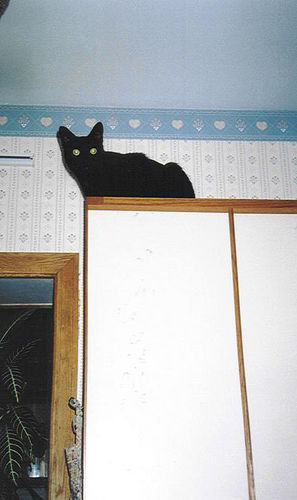

In [ ]:
display(image)

### inference!

In [ ]:
def get_bytes(image):
  return image['bytes']

image_bytes_list = list(cats_df.image.apply(get_bytes))

In [ ]:
texts = ["picture of a pretty cat", "picture of an ugly cat"]
cat_result = get_similarity_scores_batch(image_bytes_list, texts)
cat_result

,image_path,pretty,ugly
0,b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x01...,0.821488,0.178512
1,b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x01...,0.877141,0.122859
2,b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x01...,0.843921,0.156079
3,b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x01...,0.288922,0.711078
4,b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x01...,0.927846,0.072154
...,...,...,...
95,b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x01...,0.926805,0.073195
96,b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x01...,0.916023,0.083977
97,b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x01...,0.963084,0.036916
98,b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x01...,0.754276,0.245724


### show top 3 prettiest cats

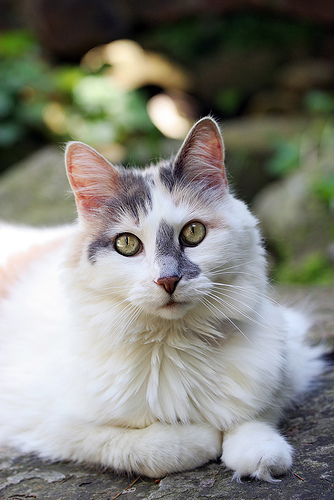

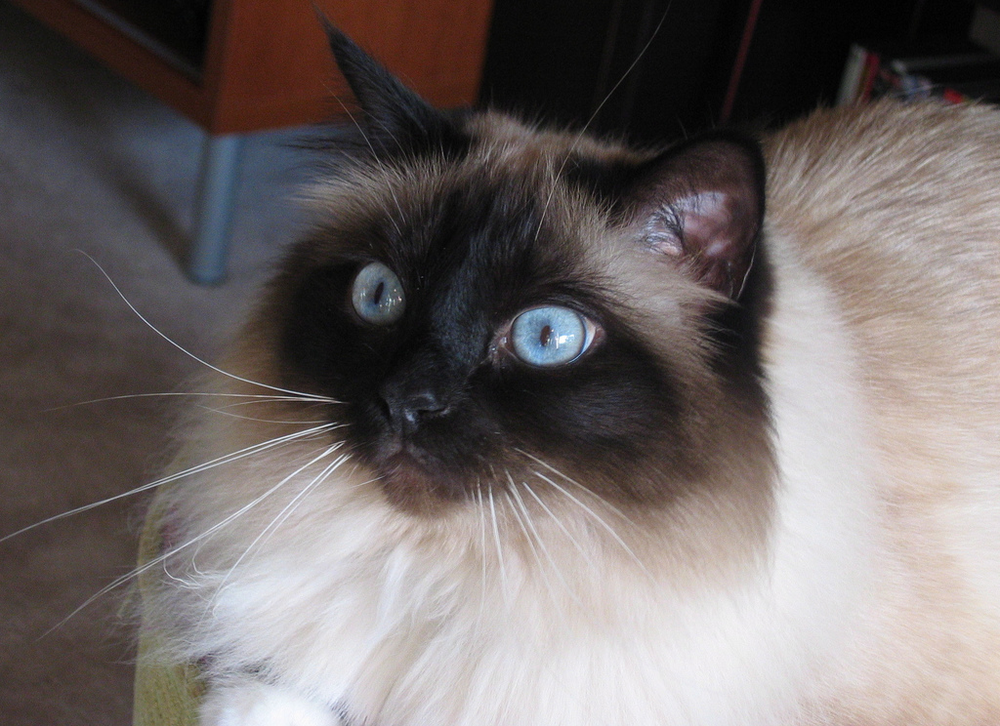

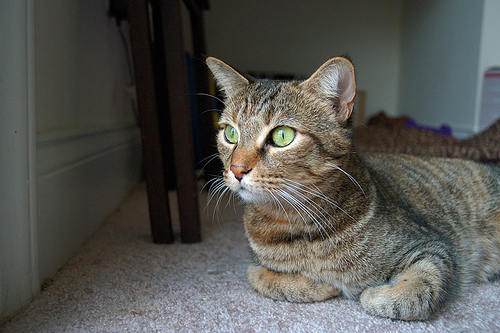

In [ ]:
pretty_cats = cat_result.sort_values(by='pretty', ascending=False).head(3)
for _, row in pretty_cats.iterrows():
  display(load_image(row['image_path']))

### Show 3 ugliest cats

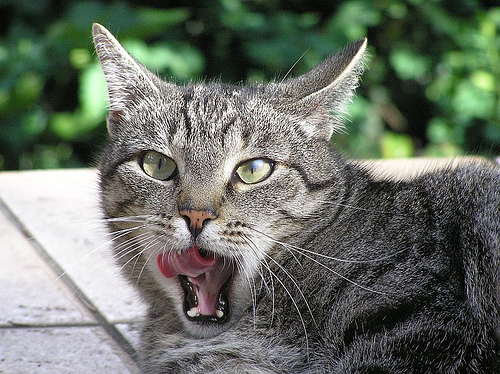

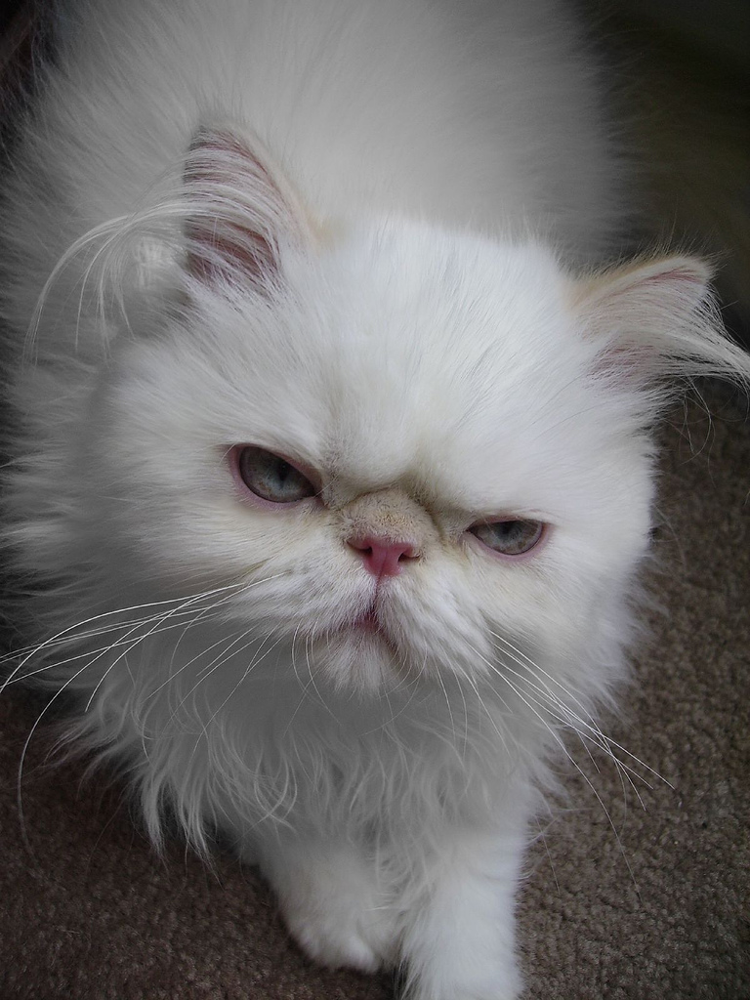

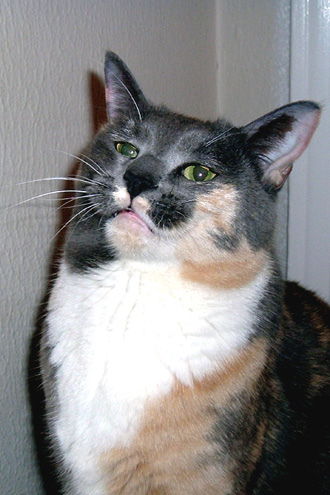

In [ ]:
pretty_cats = cat_result.sort_values(by='pretty', ascending=True).head(3)
for _, row in pretty_cats.iterrows():
  display(load_image(row['image_path']))

## Benchmark VRAM usage

We will try to run different batch sizes to see how many cats we can safely rate

In [ ]:
curr_len = len(cats_ds) #doesn't work - RAM issue
curr_len = 10000 # doesn't work - RAM issue
curr_len = 1000 # doesn't work - VRAM issue
curr_len = 500 # doesn't work - VRAM issue
curr_len = 250 #this works! 14.5GB/15 availiable, this is the limit.

In [ ]:
cats_df = cats_ds.select(range(curr_len)).to_pandas()
image_bytes_list = list(cats_df.image.apply(get_bytes))
texts = ["picture of a pretty cat", "picture of an ugly cat"]
cat_result = get_similarity_scores_batch(image_bytes_list, texts)
cat_result

,image_path,pretty,ugly
0,b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x01...,0.821487,0.178513
1,b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x01...,0.877141,0.122859
2,b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x01...,0.843921,0.156079
3,b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x01...,0.288922,0.711078
4,b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x01...,0.927846,0.072154
...,...,...,...
245,b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x01...,0.669688,0.330312
246,b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x01...,0.516450,0.483550
247,b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x01...,0.623855,0.376145
248,b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x01...,0.630254,0.369746


## Perform inference on complete dataset

### define all batch indexes

In [ ]:
images_to_process_count = len(cats_ds)
batch_size = 250
start_index = 0
end_index = start_index+batch_size
number_of_batches = images_to_process_count // batch_size
index_list = []

for i in range(number_of_batches-1):
  index_list.append((start_index, end_index))
  # print(f'{start_index} - {end_index}')
  start_index = end_index
  end_index = start_index+batch_size
# print(f'{start_index} - {end_index}')
index_list.append((start_index, end_index))

remaining_samples = images_to_process_count - end_index
# print(f'remaining samples: {remaining_samples}')
start_index = end_index
end_index = end_index+remaining_samples
index_list.append((start_index, end_index))
index_list

[(0, 250),
 (250, 500),
 (500, 750),
 (750, 1000),
 (1000, 1250),
 (1250, 1500),
 (1500, 1750),
 (1750, 2000),
 (2000, 2250),
 (2250, 2500),
 (2500, 2750),
 (2750, 3000),
 (3000, 3250),
 (3250, 3500),
 (3500, 3750),
 (3750, 4000),
 (4000, 4250),
 (4250, 4500),
 (4500, 4750),
 (4750, 5000),
 (5000, 5250),
 (5250, 5500),
 (5500, 5750),
 (5750, 6000),
 (6000, 6250),
 (6250, 6500),
 (6500, 6750),
 (6750, 7000),
 (7000, 7250),
 (7250, 7500),
 (7500, 7750),
 (7750, 8000),
 (8000, 8250),
 (8250, 8500),
 (8500, 8750),
 (8750, 9000),
 (9000, 9250),
 (9250, 9500),
 (9500, 9750),
 (9750, 9936)]

### Perform inference on complete dataset  

We will perform inference on the complete dataset and then join all the batch dataset results into a single dataframe

In [ ]:
result_list = []
for indexes in tqdm(index_list, desc="Cat beauty inference in progress..."):
  cats_df = cats_ds.select(range(*indexes)).to_pandas()
  image_bytes_list = list(cats_df.image.apply(get_bytes))
  texts = ["picture of a pretty cat", "picture of an ugly cat"]
  cat_result = get_similarity_scores_batch(image_bytes_list, texts)
  result_list.append(cat_result)

Cat beauty inference in progress...:   0%|          | 0/40 [00:00<?, ?it/s]

In [ ]:
len(result_list)

40

In [ ]:
results = pd.concat(result_list)
len(results.image_path.unique())

9936

### save results to drive - EDIT: Nooooooo

The dataset is heavy AF!  We shall only keep indexes and drop images first.

In [ ]:
del results['image_path']

In [ ]:
results.to_csv('/content/drive/MyDrive/AI/cats/pretty_cats.csv')

## Conclusion  

We can easily sort cats from petty to ugly, and it is quite fast.  

Now, if we want to make a funny website about it, we shall find a way to host 9k images for free and access them.  